In [1]:
import os
import re
import random
import numpy as np
import pandas as pd
import librosa
import matplotlib.pyplot as plt
import IPython.display as ipd


from tqdm import tqdm
from pydub import AudioSegment

import albumentations
from albumentations.core.transforms_interface import DualTransform, BasicTransform

import warnings
warnings.filterwarnings('ignore')

In [2]:
path = f"../input/birdsong-resampled-train-audio-00/aldfly/XC134874.wav"
sample_rate = 16000
sound = AudioSegment.from_wav(path)
sound = sound.set_frame_rate(sample_rate)

data = np.array(sound.get_array_of_samples(), dtype=np.float32), sample_rate

In [3]:
class AudioTransform(BasicTransform):
    """Transform for Audio task"""

    @property
    def targets(self):
        return {"data": self.apply}
    
    def update_params(self, params, **kwargs):
        if hasattr(self, "interpolation"):
            params["interpolation"] = self.interpolation
        if hasattr(self, "fill_value"):
            params["fill_value"] = self.fill_value
        return params

In [4]:
    """It simply add some random value into data by using numpy"""
    def __init__(self, always_apply=False, p=0.5):
        super(NoiseInjection, self).__init__(always_apply, p)
    
    def apply(self, data, noise_levels=(0, 0.5), **params):
        sound, sr = data
        noise_level = np.random.uniform(*noise_levels)
        noise = np.random.randn(len(sound))
        augmented_sound = sound + noise_level * noise
        # Cast back to same data type
        augmented_sound = augmented_sound.astype(type(sound[0]))

        return augmented_sound, sr

In [5]:
class NoiseInjection(AudioTransform):
    """It simply add some random value into data by using numpy"""
    def __init__(self, always_apply=False, p=0.5):
        super(NoiseInjection, self).__init__(always_apply, p)
    
    def apply(self, data, noise_levels=(0, 0.5), **params):
        sound, sr = data
        noise_level = np.random.uniform(*noise_levels)
        noise = np.random.randn(len(sound))
        augmented_sound = sound + noise_level * noise
        # Cast back to same data type
        augmented_sound = augmented_sound.astype(type(sound[0]))

        return augmented_sound, sr

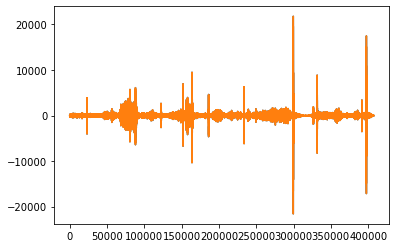

In [6]:
transform = NoiseInjection(p=1.0)
sound_aug, sr = transform(data=data)['data']

plt.plot(data[0])
plt.plot(sound_aug)
plt.show()

display(ipd.Audio(data[0], rate=sr))
display(ipd.Audio(sound_aug, rate=sr))

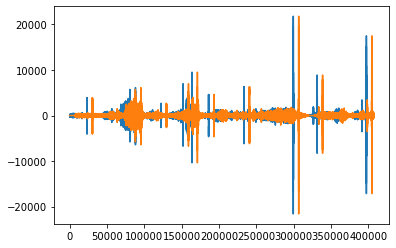

In [7]:
class ShiftingTime(AudioTransform):
    """Shifting time axis"""
    def __init__(self, always_apply=False, p=0.5):
        super(ShiftingTime, self).__init__(always_apply, p)
    
    def apply(self, data, **params):
        sound, sr = data

        shift_max = np.random.randint((len(sound)/sr)/2)
        shift = np.random.randint(sr * shift_max)
        direction = np.random.randint(0,2)
        if direction == 1:
            shift = -shift

        augmented_sound = np.roll(sound, shift)
        # Set to silence for heading/ tailing
        if shift > 0:
            augmented_sound[:shift] = 0
        else:
            augmented_sound[shift:] = 0

        return augmented_sound, sr

    
transform = ShiftingTime(p=1.0)
sound_aug, sr = transform(data=data)['data']

plt.plot(data[0])
plt.plot(sound_aug)
plt.show()

display(ipd.Audio(data[0], rate=sr))
display(ipd.Audio(sound_aug, rate=sr))

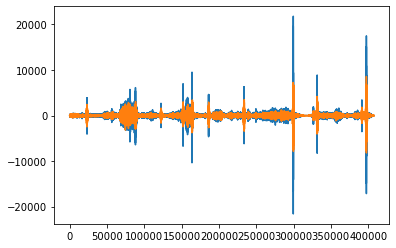

In [8]:
class PitchShift(AudioTransform):
    """Shifting time axis"""
    def __init__(self, always_apply=False, p=0.5):
        super(PitchShift, self).__init__(always_apply, p)
    
    def apply(self, data, **params):
        sound, sr = data

        n_steps = np.random.randint(-10, 10)
        augmented_sound = librosa.effects.pitch_shift(sound, sr, n_steps)

        return augmented_sound, sr
    
transform = PitchShift(p=1.0)
sound_aug, sr = transform(data=data)['data']

plt.plot(data[0])
plt.plot(sound_aug)
plt.show()

display(ipd.Audio(data[0], rate=sr))
display(ipd.Audio(sound_aug, rate=sr))

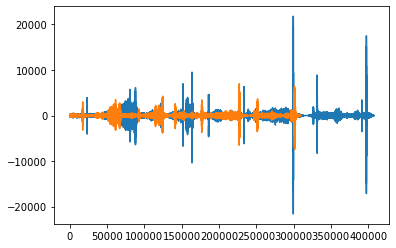

In [9]:
class TimeStretch(AudioTransform):
    """Shifting time axis"""
    def __init__(self, always_apply=False, p=0.5):
        super(TimeStretch, self).__init__(always_apply, p)
    
    def apply(self, data, **params):
        sound, sr = data

        rate = np.random.uniform(0, 2)
        augmented_sound = librosa.effects.time_stretch(sound, rate)

        return augmented_sound, sr

transform = TimeStretch(p=1.0)
sound_aug, sr = transform(data=data)['data']

plt.plot(data[0])
plt.plot(sound_aug)
plt.show()

display(ipd.Audio(data[0], rate=sr))
display(ipd.Audio(sound_aug, rate=sr))

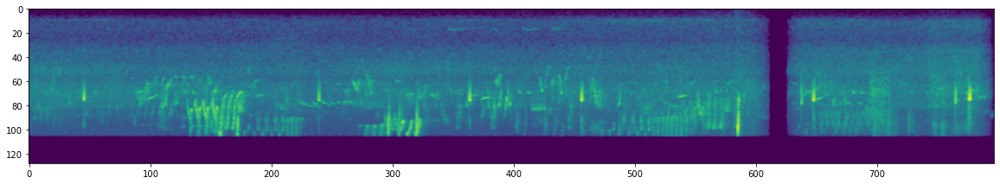

In [10]:
class MelSpectrogram(AudioTransform):
    """Shifting time axis"""
    def __init__(self, parameters, always_apply=False, p=0.5):
        super(MelSpectrogram, self).__init__(always_apply, p)

        self.parameters = parameters
    
    def apply(self, data, **params):
        sound, sr = data

        melspec = librosa.feature.melspectrogram(sound, sr=sr, **self.parameters)
        melspec = librosa.power_to_db(melspec)
        melspec = melspec.astype(np.float32)

        return melspec, sr
    
    
    
melspectrogram_parameters = {
        "n_mels": 128,
        "fmin": 20,
        "fmax": 16000
    }

transform = MelSpectrogram(parameters=melspectrogram_parameters, p=1.0)

melspec, sr = transform(data=data)['data']

plt.figure(figsize=(20,10))
plt.imshow(melspec)
plt.show()

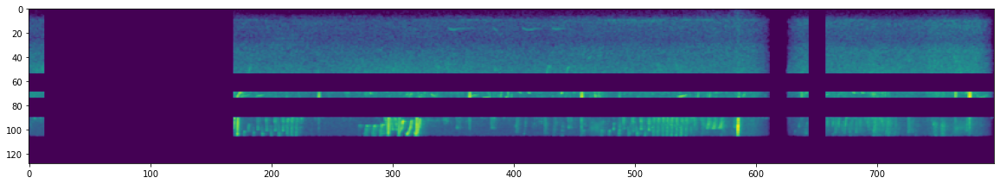

In [11]:
class SpecAugment(AudioTransform):
    """Shifting time axis"""
    def __init__(self, num_mask=2, freq_masking=0.15, time_masking=0.20, always_apply=False, p=0.5):
        super(SpecAugment, self).__init__(always_apply, p)

        self.num_mask = num_mask
        self.freq_masking = freq_masking
        self.time_masking = time_masking
    
    def apply(self, data, **params):
        melspec, sr = data

        spec_aug = self.spec_augment(melspec, 
                                     self.num_mask,
                                     self.freq_masking,
                                     self.time_masking,
                                     melspec.min())
        


        return spec_aug, sr
    

    def spec_augment(self, 
                    spec: np.ndarray,
                    num_mask=2,
                    freq_masking=0.15,
                    time_masking=0.20,
                    value=0):
        spec = spec.copy()
        num_mask = random.randint(1, num_mask)
        for i in range(num_mask):
            all_freqs_num, all_frames_num  = spec.shape
            freq_percentage = random.uniform(0.0, freq_masking)

            num_freqs_to_mask = int(freq_percentage * all_freqs_num)
            f0 = np.random.uniform(low=0.0, high=all_freqs_num - num_freqs_to_mask)
            f0 = int(f0)
            spec[f0:f0 + num_freqs_to_mask, :] = value

            time_percentage = random.uniform(0.0, time_masking)

            num_frames_to_mask = int(time_percentage * all_frames_num)
            t0 = np.random.uniform(low=0.0, high=all_frames_num - num_frames_to_mask)
            t0 = int(t0)
            spec[:, t0:t0 + num_frames_to_mask] = value

        return spec
    
    
    
transform = SpecAugment(p=1.0)
data = melspec, sr

specAug, sr = transform(data=data)['data']

plt.figure(figsize=(20,10))
plt.imshow(specAug)
plt.show()

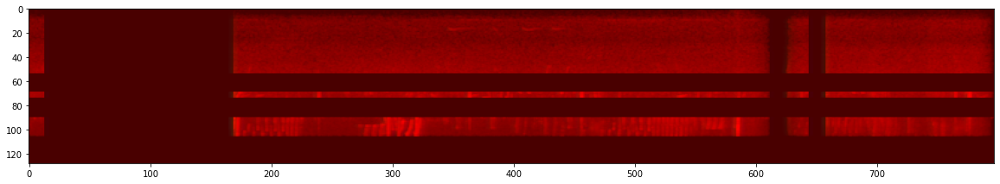

In [12]:
class SpectToImage(AudioTransform):

    def __init__(self, always_apply=False, p=0.5):
        super(SpectToImage, self).__init__(always_apply, p)
    
    def apply(self, data, **params):
        image, sr = data
        delta = librosa.feature.delta(image)
        accelerate = librosa.feature.delta(image, order=2)
        image = np.stack([image, delta, accelerate], axis=-1)
        image = image.astype(np.float32) / 100.0

        return image
transform = SpectToImage(p=1.0)
data = specAug, sr

image = transform(data=data)['data']

plt.figure(figsize=(20,10))
plt.imshow(image)
plt.show()

Show All

In [13]:
# audio_augmentation = albumentations.Compose([
#      RandomAudio(always_apply=True),
#      NoiseInjection(p=1),
#      MelSpectrogram(parameters=melspectrogram_parameters,always_apply=True),
#      SpecAugment(p=1),
#      SpectToImage(always_apply=True)
# ])

# data = np.array(sound.get_array_of_samples(), dtype=np.float32), sample_rate
# image = audio_augmentation(data=data)['data']

# plt.imshow(image)
# plt.show()

In [14]:
class CutOut(AudioTransform):
    def __init__(self, always_apply=False, p=0.5 ):
        super(CutOut, self).__init__(always_apply, p)
        
    def apply(self,data,**params):
        '''
        data : ndarray of audio timeseries
        '''
        start_ = np.random.randint(0,len(data))
        end_ = np.random.randint(start_,len(data))
        
        data[start_:end_] = 0
        
        return data
    


y,sr = librosa.load(path,sr=16000)

print('Audio Intially')
ipd.Audio(y, rate=sr)

Audio Intially


In [15]:
transform = CutOut(p=1.0)

print('audio after transform')
ipd.Audio(transform(data=y)['data'],rate=sr)

audio after transform
